In [1]:
%load_ext nb_black

<IPython.core.display.Javascript object>

# BTVN Assignment 1: Làm quen với Python cho xử lý ảnh

Load ảnh và hiển thị đồng thời các cả các ảnh trong thư mục **img** trên jupyter notebook. Sau đó dùng thư viện openCV để biến đổi các bức ảnh thành chế độ đen trắng, HSV, Lab và hiển thị kết quả.

In [2]:
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import cv2, glob
import numpy as np

<IPython.core.display.Javascript object>

In [3]:
def display_imgs(images_set, grid_shape=(8, 8)):
    assert len(images_set) <= grid_shape[0] * grid_shape[1]
    fig = plt.figure(figsize=(grid_shape[0] * 10, grid_shape[1] * 10))
    for i in range(len(images_set)):
        fig.add_subplot(grid_shape[0], grid_shape[1], i + 1)
        if images_set[i][1]:
            plt.imshow(images_set[i][0], cmap="gray")
        else:
            plt.imshow(images_set[i][0])
    plt.show()

<IPython.core.display.Javascript object>

In [4]:
imgs = [cv2.imread(img_path) for img_path in glob.glob("img/*")]
for img in imgs:
    print(img.shape)

(341, 512, 3)
(600, 900, 3)
(733, 1024, 3)
(373, 663, 3)


<IPython.core.display.Javascript object>

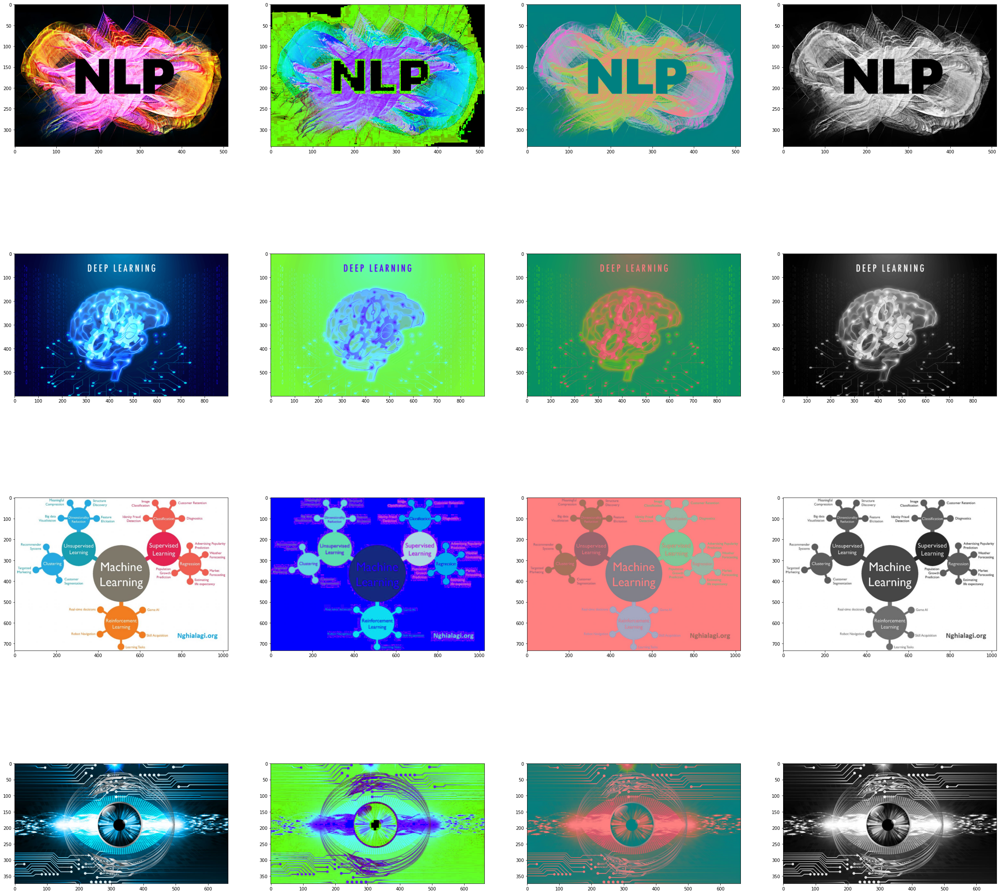

<IPython.core.display.Javascript object>

In [5]:
imgs_show = []
for i in range(len(imgs)):
    imgs_show.append((cv2.cvtColor(imgs[i], cv2.COLOR_BGR2RGB), False))
    imgs_show.append((cv2.cvtColor(imgs[i], cv2.COLOR_BGR2HSV), False))
    imgs_show.append((cv2.cvtColor(imgs[i], cv2.COLOR_BGR2Lab), False))
    imgs_show.append((cv2.cvtColor(imgs[i], cv2.COLOR_BGR2GRAY), True))
display_imgs(imgs_show, (4, 4))

# BTVN Assignment 2

Trong folder pieces bao gồm các bức ảnh có cùng màu sắc với độ sáng khác nhau được cắt ra từ các bức ảnh rubik.   
Hãy biểu diễn và nhận xét sự thay đổi của các kênh màu khi có sự thay đổi về ánh sáng.

Ví dụ sau biểu diễn thang màu BGR với các ảnh màu vàng
Bạn hãy thực hiện trên các thang màu khác HSV, Lab, YCrCb và đưa ra nhận xét

In [6]:
color = "pieces/yellow"

<IPython.core.display.Javascript object>

Chọn 2 ảnh có ánh sáng tương tự nhau của màu vàng

In [7]:
zoom = 0
files = glob.glob(color + "*.jpg")
files.sort()
print(files)
files = files[6:]
print(files)

B = np.array([])
G = np.array([])
R = np.array([])

['pieces/yellowr1.jpg', 'pieces/yellowr2.jpg', 'pieces/yellowr3.jpg', 'pieces/yellowr4.jpg', 'pieces/yellowr5.jpg', 'pieces/yellowr6.jpg', 'pieces/yellowr7.jpg', 'pieces/yellowr8.jpg']
['pieces/yellowr7.jpg', 'pieces/yellowr8.jpg']


<IPython.core.display.Javascript object>

In [8]:
for fi in files[:]:
    im = cv2.imread(fi)
    b = im[:, :, 0]
    b = b.reshape(b.shape[0] * b.shape[1])
    g = im[:, :, 1]
    g = g.reshape(g.shape[0] * g.shape[1])
    r = im[:, :, 2]
    r = r.reshape(r.shape[0] * r.shape[1])
    B = np.append(B, b)
    G = np.append(G, g)
    R = np.append(R, r)

<IPython.core.display.Javascript object>

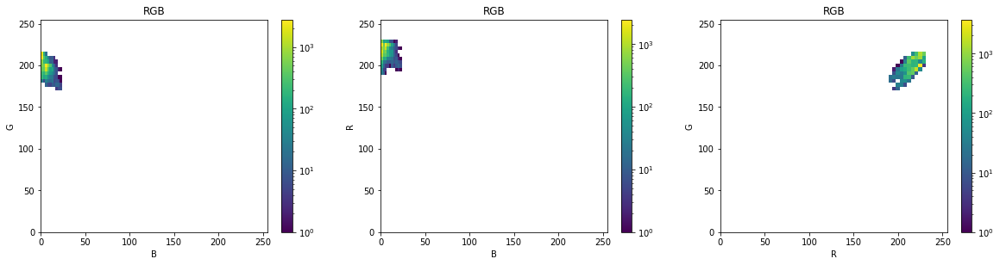

<IPython.core.display.Javascript object>

In [9]:
# Plotting the histogram
nbins = 10
plt.figure(figsize=[20, 10])
plt.subplot(2, 3, 1)
plt.hist2d(B, G, bins=nbins, norm=LogNorm())
plt.xlabel("B")
plt.ylabel("G")
plt.title("RGB")
if not zoom:
    plt.xlim([0, 255])
    plt.ylim([0, 255])
plt.colorbar()
plt.subplot(2, 3, 2)
plt.hist2d(B, R, bins=nbins, norm=LogNorm())
plt.xlabel("B")
plt.ylabel("R")
plt.title("RGB")
if not zoom:
    plt.xlim([0, 255])
    plt.ylim([0, 255])
plt.colorbar()
plt.subplot(2, 3, 3)
plt.hist2d(R, G, bins=nbins, norm=LogNorm())
plt.xlabel("R")
plt.ylabel("G")
plt.title("RGB")
if not zoom:
    plt.xlim([0, 255])
    plt.ylim([0, 255])
plt.colorbar()

Biểu đồ sự thay đổi với 8 ảnh khác nhau của màu vàng

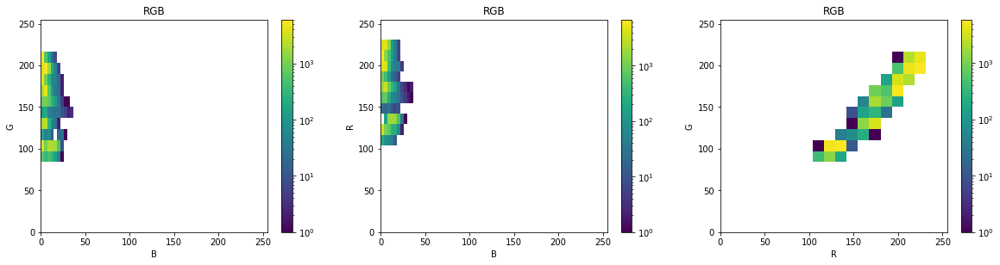

<IPython.core.display.Javascript object>

In [10]:
zoom = 0
# load tất cả các file trong folder
files = glob.glob(color + "*.jpg")
files.sort()
B = np.array([])
G = np.array([])
R = np.array([])
for fi in files[:]:
    # BGR
    im = cv2.imread(fi)
    b = im[:, :, 0]
    b = b.reshape(b.shape[0] * b.shape[1])
    g = im[:, :, 1]
    g = g.reshape(g.shape[0] * g.shape[1])
    r = im[:, :, 2]
    r = r.reshape(r.shape[0] * r.shape[1])
    B = np.append(B, b)
    G = np.append(G, g)
    R = np.append(R, r)
# Plotting the histogram
nbins = 10
plt.figure(figsize=[20, 10])
plt.subplot(2, 3, 1)
plt.hist2d(B, G, bins=nbins, norm=LogNorm())
plt.xlabel("B")
plt.ylabel("G")
plt.title("RGB")
if not zoom:
    plt.xlim([0, 255])
    plt.ylim([0, 255])
plt.colorbar()
plt.subplot(2, 3, 2)
plt.hist2d(B, R, bins=nbins, norm=LogNorm())
plt.colorbar()
plt.xlabel("B")
plt.ylabel("R")
plt.title("RGB")
if not zoom:
    plt.xlim([0, 255])
    plt.ylim([0, 255])
plt.subplot(2, 3, 3)
plt.hist2d(R, G, bins=nbins, norm=LogNorm())
plt.colorbar()
plt.xlabel("R")
plt.ylabel("G")
plt.title("RGB")
if not zoom:
    plt.xlim([0, 255])
    plt.ylim([0, 255])

## Các hàm hữu ích

In [11]:
def get_images(color, color_space):
    files = glob.glob("pieces/" + color + "*.jpg")
    files.sort()
    for i in range(len(files)):
        files[i] = cv2.cvtColor(
            cv2.imread(files[i]), getattr(cv2, "COLOR_BGR2" + color_space)
        )
    return files

<IPython.core.display.Javascript object>

In [12]:
def get_channels(images):
    first = np.array([])
    second = np.array([])
    third = np.array([])
    for im in images:
        _1st = im[:, :, 0]
        _1st = _1st.reshape(_1st.shape[0] * _1st.shape[1])
        first = np.append(first, _1st)
        _2nd = im[:, :, 1]
        _2nd = _2nd.reshape(_2nd.shape[0] * _2nd.shape[1])
        second = np.append(second, _2nd)
        _3rd = im[:, :, 2]
        _3rd = _3rd.reshape(_3rd.shape[0] * _3rd.shape[1])
        third = np.append(third, _3rd)
    return (first, second, third)

<IPython.core.display.Javascript object>

In [13]:
def plot_histogram(channels: tuple, channels_name: tuple):
    nbins = 10
    plt.figure(figsize=[20, 10])
    plt.subplot(2, 3, 1)
    plt.hist2d(channels[0], channels[1], bins=nbins, norm=LogNorm())
    plt.xlabel(channels_name[0])
    plt.ylabel(channels_name[1])
    plt.title(channels_name[0] + channels_name[1] + channels_name[2])
    if not zoom:
        plt.xlim([0, 255])
        plt.ylim([0, 255])
    plt.colorbar()
    plt.subplot(2, 3, 2)
    plt.hist2d(channels[0], channels[2], bins=nbins, norm=LogNorm())
    plt.xlabel(channels_name[0])
    plt.ylabel(channels_name[2])
    plt.title(channels_name[0] + channels_name[1] + channels_name[2])
    if not zoom:
        plt.xlim([0, 255])
        plt.ylim([0, 255])
    plt.colorbar()
    plt.subplot(2, 3, 3)
    plt.hist2d(channels[2], channels[1], bins=nbins, norm=LogNorm())
    plt.xlabel(channels_name[2])
    plt.ylabel(channels_name[1])
    plt.title(channels_name[0] + channels_name[1] + channels_name[2])
    if not zoom:
        plt.xlim([0, 255])
        plt.ylim([0, 255])
    plt.colorbar()

<IPython.core.display.Javascript object>

## Thử các thang màu khác với tập dữ liệu màu vàng

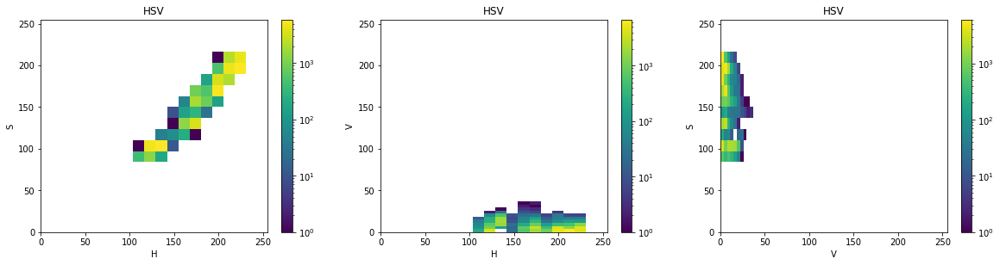

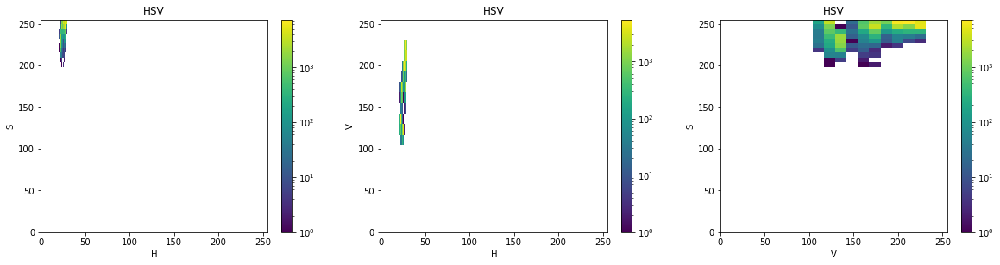

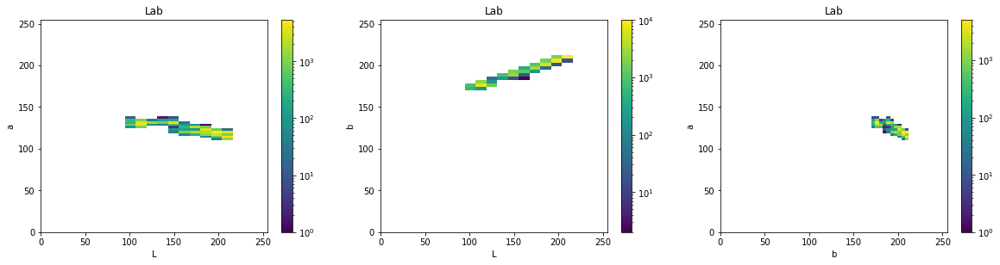

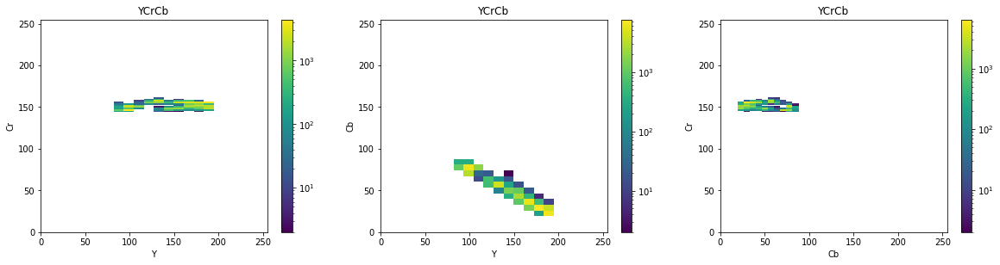

<IPython.core.display.Javascript object>

In [14]:
yellow_RGB = get_images("yellow", "RGB")
y_R, y_G, y_B = get_channels(yellow_RGB)
plot_histogram((y_R, y_G, y_B), ("H", "S", "V"))

yellow_HSV = get_images("yellow", "HSV")
y_H, y_S, y_V = get_channels(yellow_HSV)
plot_histogram((y_H, y_S, y_V), ("H", "S", "V"))

yellow_Lab = get_images("yellow", "Lab")
y_L, y_a, y_b = get_channels(yellow_Lab)
plot_histogram((y_L, y_a, y_b), ("L", "a", "b"))

yellow_YCrCb = get_images("yellow", "YCrCb")
y_Y, y_Cr, y_Cb = get_channels(yellow_YCrCb)
plot_histogram((y_Y, y_Cr, y_Cb), ("Y", "Cr", "Cb"))

## Thử với tập dữ liệu màu xanh dương

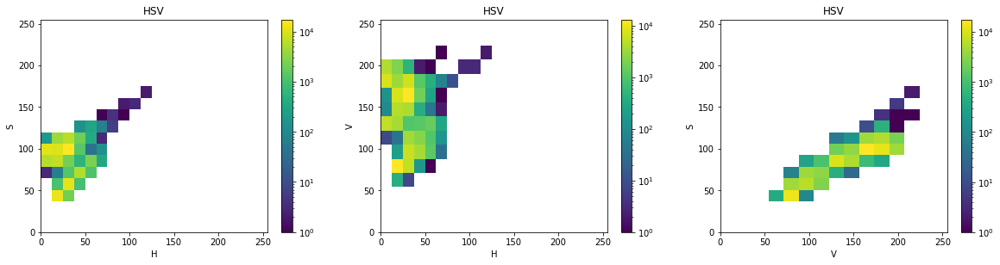

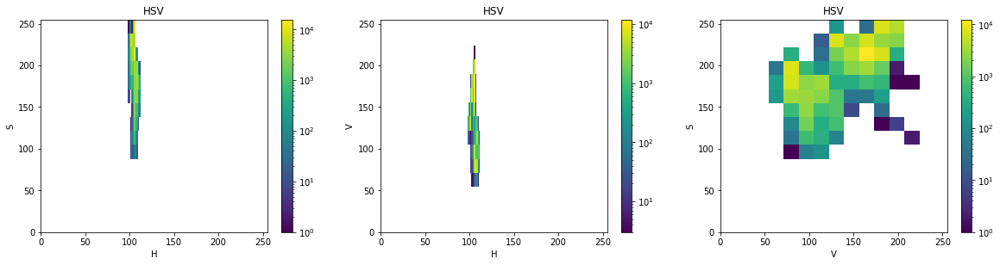

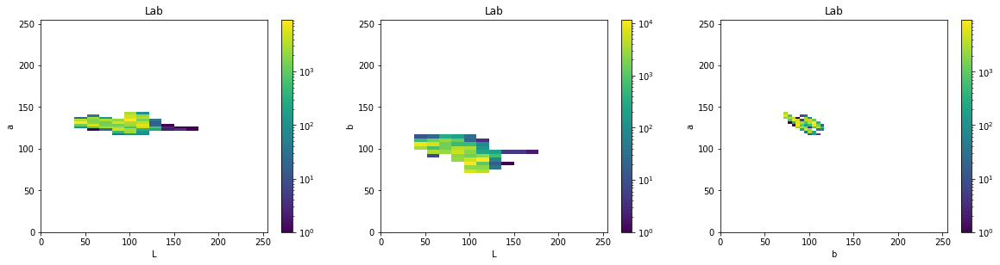

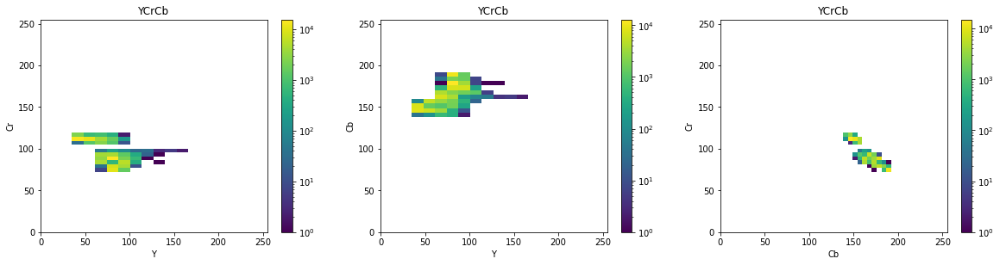

<IPython.core.display.Javascript object>

In [15]:
blue_RGB = get_images("blue", "RGB")
b_R, b_G, b_B = get_channels(blue_RGB)
plot_histogram((b_R, b_G, b_B), ("H", "S", "V"))

blue_HSV = get_images("blue", "HSV")
b_H, b_S, b_V = get_channels(blue_HSV)
plot_histogram((b_H, b_S, b_V), "HSV")

blue_Lab = get_images("blue", "Lab")
b_L, b_a, b_b = get_channels(blue_Lab)
plot_histogram((b_L, b_a, b_b), ("L", "a", "b"))

blue_YCrCb = get_images("blue", "YCrCb")
b_Y, b_Cr, b_Cb = get_channels(blue_YCrCb)
plot_histogram((b_Y, b_Cr, b_Cb), ("Y", "Cr", "Cb"))

## Nhận xét

- Thang màu RGB: Giá trị các kênh màu thay đổi đáng kể khi độ sáng thay đổi.
- Thang màu HSV: Giá trị kênh H thay đổi rất ít khi độ sáng thay đổi &rarr; Kênh H mang nhiều thông tin về màu sắc.
- Thang màu Lab: Giá trị kênh a và kênh b ít thay đổi. 
- Thang màu YCrCb: Giá trị kênh Cr và kênh Cb ít thay đổi hơn kênh Y.

# BTVN Assignment 3
- Sử dụng không gian màu để phát hiện da trong bức ảnh
- có thể sử dụng các ngưỡng sau :
  - 0<=H<=17 and 15<=S<=170 and 0<=V<=255
  - 0<=Y<=255 and 135<=Cr<=180 and 85<=Cb<=135
  - 0<=Y<=255 and 150<=Cr<=200 and 100<=Cb<=150
- Có thể kết hợp các kết quả 2 không gian với nhau
- So sánh và nhận xét trên các tập dữ liệu trong folder skin
-Tài liệu tham khảo: 
     https://linkinghub.elsevier.com/retrieve/pii/S0262885620300573
     Shaik_ICRTC-2015: Comparative Study of Skin Color Detection and Segmentation in HSV and YCbCr Color Space

In [16]:
# Load test images
HGR1 = glob.glob("skin/HGR1/*/*.jpg")
HGR2a = glob.glob("skin/HGR2a/*/*.jpg")
SFA = glob.glob("skin/SFA/*/*.jpg")

# Remove output images
for images in (HGR1, HGR2a, SFA):
    for im in images:
        if "output" in im:
            images.remove(im)

# Load as images
for images in (HGR1, HGR2a, SFA):
    for i in range(len(images)):
        images[i] = cv2.imread(images[i])
        # Convert to RGB
        images[i] = cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB)

<IPython.core.display.Javascript object>

Thử hiển thị tập ảnh

HGR1


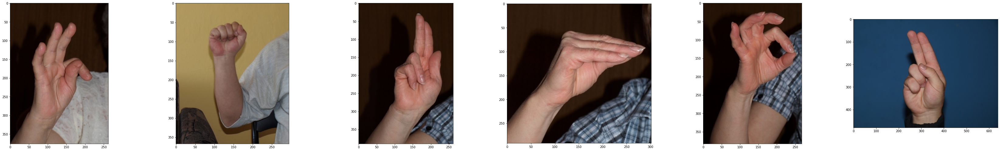

HGR2a


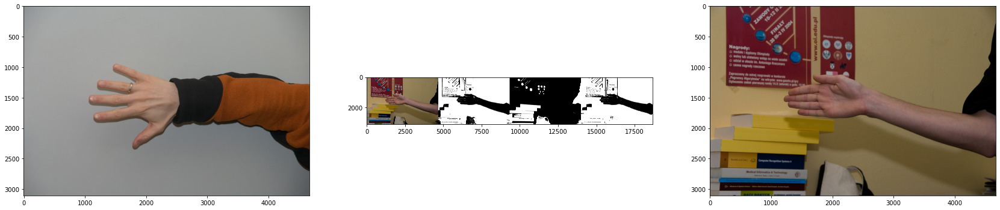

SFA


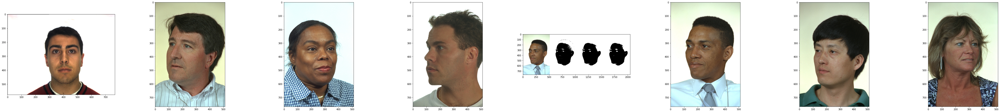

<IPython.core.display.Javascript object>

In [17]:
print("HGR1")
display_imgs([(img, False) for img in HGR1])
print("HGR2a")
display_imgs([(img, False) for img in HGR2a])
print("SFA")
display_imgs([(img, False) for img in SFA])

## Thử ngưỡng 0<=H<=17 and 15<=S<=170 and 0<=V<=255
Convert to HSV

In [18]:
HGR1_HSV = []
for i in range(len(HGR1)):
    HGR1_HSV.append(cv2.cvtColor(HGR1[i], cv2.COLOR_RGB2HSV))

HGR2a_HSV = []
for i in range(len(HGR2a)):
    HGR2a_HSV.append(cv2.cvtColor(HGR2a[i], cv2.COLOR_RGB2HSV))

SFA_HSV = []
for i in range(len(SFA)):
    SFA_HSV.append(cv2.cvtColor(SFA[i], cv2.COLOR_RGB2HSV))

<IPython.core.display.Javascript object>

HGR1_HSV


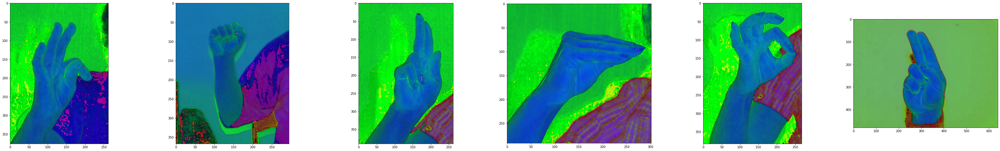

<IPython.core.display.Javascript object>

In [19]:
print("HGR1_HSV")
display_imgs([(img, False) for img in HGR1_HSV])

In [20]:
for images_HSV in (HGR1_HSV, HGR2a_HSV, SFA_HSV):
    for i in range(len(images_HSV)):
        # 0<=H<=17
        images_HSV[i][:, :, 0] = np.logical_and(
            0 <= images_HSV[i][:, :, 0], images_HSV[i][:, :, 0] <= 17
        )

        # 15<=S<=170
        images_HSV[i][:, :, 1] = np.logical_and(
            15 <= images_HSV[i][:, :, 1], images_HSV[i][:, :, 1] <= 170
        )

        # 0<=V<=255
        images_HSV[i][:, :, 2] = np.logical_and(
            0 <= images_HSV[i][:, :, 2], images_HSV[i][:, :, 2] <= 255
        )

        images_HSV[i] = np.logical_and(
            images_HSV[i][:, :, 0], images_HSV[i][:, :, 1], images_HSV[i][:, :, 2]
        )

<IPython.core.display.Javascript object>

HGR1_HSV


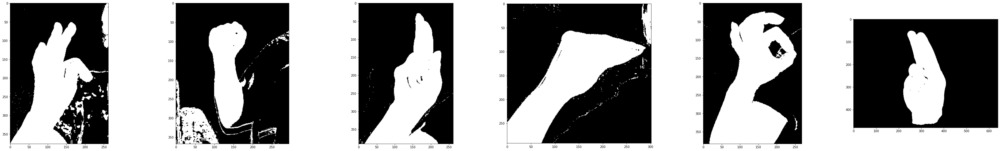

HGR2a_HSV


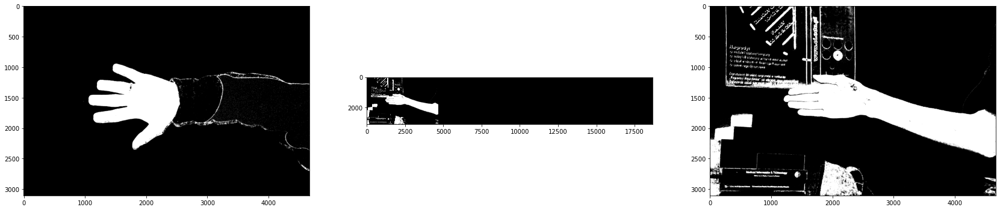

SFA_HSV


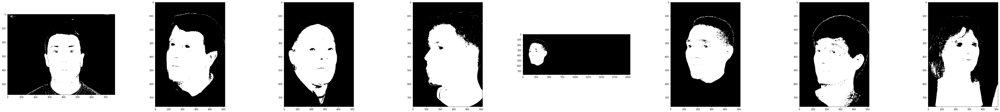

<IPython.core.display.Javascript object>

In [21]:
print("HGR1_HSV")
display_imgs([(img, True) for img in HGR1_HSV])
print("HGR2a_HSV")
display_imgs([(img, True) for img in HGR2a_HSV])
print("SFA_HSV")
display_imgs([(img, True) for img in SFA_HSV])

## Thử ngưỡng 0<=Y<=255 and 135<=Cr<=180 and 85<=Cb<=135
Convert to YCrCb

In [22]:
HGR1_YCrCb = []
for i in range(len(HGR1)):
    HGR1_YCrCb.append(cv2.cvtColor(HGR1[i], cv2.COLOR_RGB2YCrCb))

HGR2a_YCrCb = []
for i in range(len(HGR2a)):
    HGR2a_YCrCb.append(cv2.cvtColor(HGR2a[i], cv2.COLOR_RGB2YCrCb))

SFA_YCrCb = []
for i in range(len(SFA)):
    SFA_YCrCb.append(cv2.cvtColor(SFA[i], cv2.COLOR_RGB2YCrCb))

<IPython.core.display.Javascript object>

HGR1_YCrCb


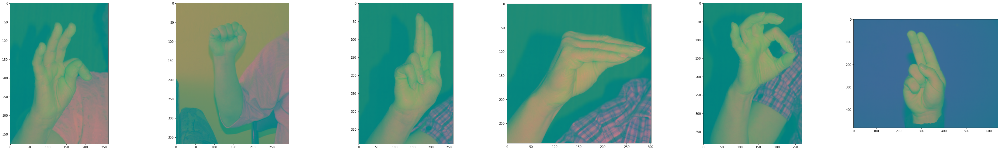

<IPython.core.display.Javascript object>

In [23]:
print("HGR1_YCrCb")
display_imgs([(img, False) for img in HGR1_YCrCb])

Áp dụng ngưỡng 0<=Y<=255 and 135<=Cr<=180 and 85<=Cb<=135

In [24]:
for images_HSV in (HGR1_YCrCb, HGR2a_YCrCb, SFA_YCrCb):
    for i in range(len(images_HSV)):
        # 0<=H<=17
        images_HSV[i][:, :, 0] = np.logical_and(
            0 <= images_HSV[i][:, :, 0], images_HSV[i][:, :, 0] <= 255
        )

        # 15<=S<=170
        images_HSV[i][:, :, 1] = np.logical_and(
            135 <= images_HSV[i][:, :, 1], images_HSV[i][:, :, 1] <= 180
        )

        # 0<=V<=255
        images_HSV[i][:, :, 2] = np.logical_and(
            85 <= images_HSV[i][:, :, 2], images_HSV[i][:, :, 2] <= 135
        )

        images_HSV[i] = np.logical_and(
            images_HSV[i][:, :, 0], images_HSV[i][:, :, 1], images_HSV[i][:, :, 2]
        )

<IPython.core.display.Javascript object>

HGR1_YCrCb


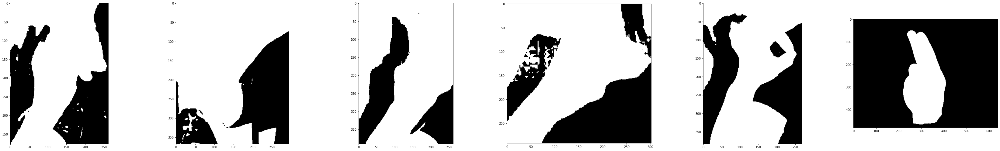

HGR2a_YCrCb


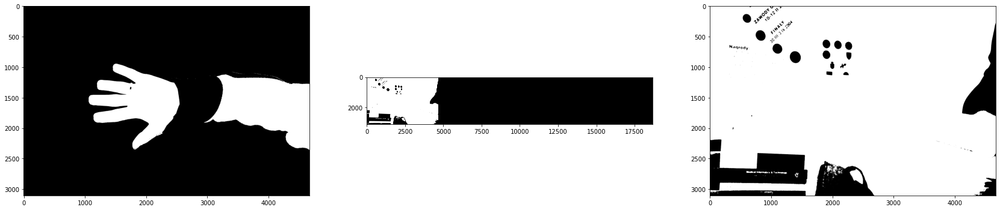

SFA_YCrCb


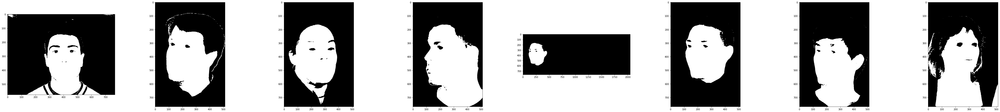

<IPython.core.display.Javascript object>

In [25]:
print("HGR1_YCrCb")
display_imgs([(img, True) for img in HGR1_YCrCb])
print("HGR2a_YCrCb")
display_imgs([(img, True) for img in HGR2a_YCrCb])
print("SFA_YCrCb")
display_imgs([(img, True) for img in SFA_YCrCb])

## Thử ngưỡng 0<=Y<=255 and 150<=Cr<=200 and 100<=Cb<=150
Convert to YCrCb

In [26]:
HGR1_YCrCb_2 = []
for i in range(len(HGR1)):
    HGR1_YCrCb_2.append(cv2.cvtColor(HGR1[i], cv2.COLOR_RGB2YCrCb))

HGR2a_YCrCb_2 = []
for i in range(len(HGR2a)):
    HGR2a_YCrCb_2.append(cv2.cvtColor(HGR2a[i], cv2.COLOR_RGB2YCrCb))

SFA_YCrCb_2 = []
for i in range(len(SFA)):
    SFA_YCrCb_2.append(cv2.cvtColor(SFA[i], cv2.COLOR_RGB2YCrCb))

<IPython.core.display.Javascript object>

HGR1_YCrCb_2


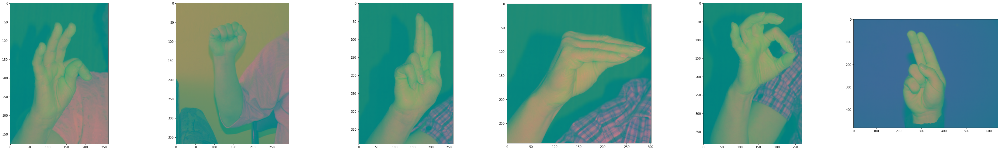

<IPython.core.display.Javascript object>

In [27]:
print("HGR1_YCrCb_2")
display_imgs([(img, False) for img in HGR1_YCrCb_2])

Áp dụng ngưỡng 0<=Y<=255 and 150<=Cr<=200 and 100<=Cb<=150

In [28]:
for images_HSV in (HGR1_YCrCb_2, HGR2a_YCrCb_2, SFA_YCrCb_2):
    for i in range(len(images_HSV)):
        # 0<=H<=17
        images_HSV[i][:, :, 0] = np.logical_and(
            0 <= images_HSV[i][:, :, 0], images_HSV[i][:, :, 0] <= 255
        )

        # 15<=S<=170
        images_HSV[i][:, :, 1] = np.logical_and(
            150 <= images_HSV[i][:, :, 1], images_HSV[i][:, :, 1] <= 200
        )

        # 0<=V<=255
        images_HSV[i][:, :, 2] = np.logical_and(
            100 <= images_HSV[i][:, :, 2], images_HSV[i][:, :, 2] <= 150
        )

        images_HSV[i] = np.logical_and(
            images_HSV[i][:, :, 0], images_HSV[i][:, :, 1], images_HSV[i][:, :, 2]
        )

<IPython.core.display.Javascript object>

HGR1_YCrCb_2


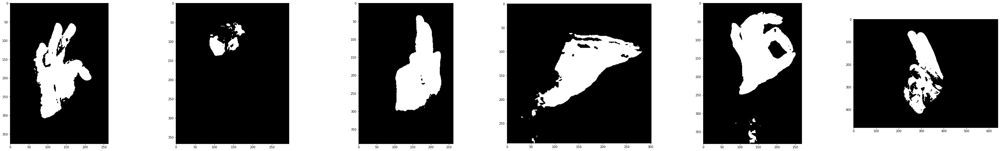

HGR2a_YCrCb_2


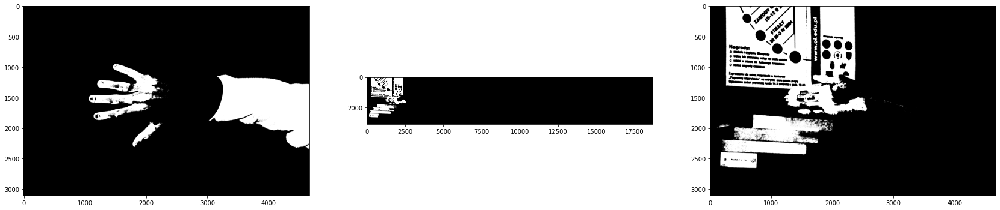

SFA_YCrCb_2


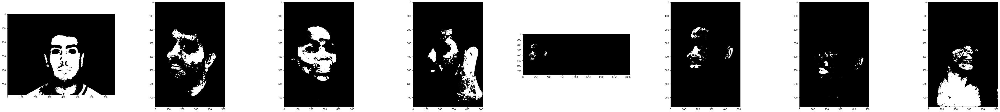

<IPython.core.display.Javascript object>

In [29]:
print("HGR1_YCrCb_2")
display_imgs([(img, True) for img in HGR1_YCrCb_2])
print("HGR2a_YCrCb_2")
display_imgs([(img, True) for img in HGR2a_YCrCb_2])
print("SFA_YCrCb_2")
display_imgs([(img, True) for img in SFA_YCrCb_2])

## Nhận xét:

- Hiệu quả của việc phát hiện da thay đổi đa dạng với các loại thang màu và ngưỡng threshold được sử dụng.
- Ngưỡng threshold thứ nhất đối với thang màu HSV đem lại kết quả tốt nhất. 
- 2 ngưỡng dành cho thang màu YCrCb đem lại kết quả không tốt bằng, dễ lẫn da người với các yếu tố khác trên hình nền.
- Việc thay đổi các ngưỡng có thể tác động lớn tới kết quả. Điều này có thể thấy thông qua 2 ví dụ đối với thang màu YCrCb.